In [ ]:
from dredFISH.Processing.Section import *
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/WellA-Section3/anndata/anndata.h5ad')
data

In [ ]:
n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle('Stain Signal Log')
axs = axs.ravel()
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['nuc_raw'].copy()
X = X/np.median(X,axis=0,keepdims=True)

# X = (X - np.median(X,axis=1,keepdims=True)) / np.median(X.std(axis=1, keepdims=True))
# X =np.abs(X)
from scipy.stats import norm

# X = norm.logpdf(X)

# X = basicu.normalize_fishdata_robust_regression(X)
# X = basicu.normalize_fishdata_regress(X,value='sum',leave_log=True,log=True,bitwise=False)
# X = basicu.normalize_fishdata_regress(X,value='none',leave_log=False,log=False,bitwise=True)
for i in range(n_bits):
    c = X[:,i].copy()
    vmin,vmax = np.percentile(c[np.isnan(c)==False],[5,95])
    # vmin= -5
    # vmax = 5
    scatter = axs[i].scatter(x,y,c=np.clip(c,vmin,vmax),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()

In [ ]:
n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['nuc_raw'].copy()
X = np.clip(X,1,None)
X = X/np.median(X,axis=0,keepdims=True)
X = X/np.median(X,axis=1,keepdims=True)

X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True))
from scipy.stats import norm

X = norm.pdf(X)/norm.pdf(0)

fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle('')
axs = axs.ravel()

for i in range(n_bits):
    c = X[:,i].copy()
    vmin,vmax = np.percentile(c[np.isnan(c)==False],[1,99])
    # vmin= -3
    # vmax = -1
    scatter = axs[i].scatter(x,y,c=np.clip(c,vmin,vmax),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()





In [ ]:
c = data.obs['sum'].copy()
vmin,vmax = np.percentile(c,[5,95])
m = np.min(X,axis=1)>0.5
plt.scatter(x[m],y[m],c=np.clip(c,vmin,vmax)[m],s=0.01,cmap='jet',marker='x')
plt.colorbar()
plt.show()

In [ ]:
plt.hist(X.ravel(),bins=1000)
plt.show()

In [ ]:
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/WellA-Section3/anndata/anndata.h5ad')
data

x = data.obs['stage_x']
y = data.obs['stage_y']

c = data.obs['sum'].copy()
vmin,vmax = np.percentile(c,[5,95])
X = np.log10(data.layers['raw'].sum(1).ravel())
X = (X-np.median(X))/np.std(X)
X = norm.pdf(X)/norm.pdf(0)
m = X>0.01
plt.scatter(x[m],y[m],c=np.clip(c,vmin,vmax)[m],s=0.01,cmap='jet',marker='x')
plt.colorbar()
plt.show()

m = X<0.01
plt.scatter(x[m],y[m],c=np.clip(c,vmin,vmax)[m],s=0.01,cmap='jet',marker='x')
plt.colorbar()
plt.show()

In [ ]:
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/WellA-Section4/anndata/anndata.h5ad')
data

In [ ]:
data.var

In [ ]:
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/WellA-Section4/anndata/anndata.h5ad')
data
# Drop the 'IEG' variable from the data
data = data[:, np.array(data.var.index)!='IEG']


""" Nuclei Score """
""" detects cells whose brightness changes too much """
""" Likely due to gel or registration issues """
X = data.layers['nuc_raw'].copy()
X = np.clip(X,1,None) # Prevent divide by 0
X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['raw'].sum(1).ravel()
X = np.clip(X,1,None)
X = np.log10(X)
X = (X-np.median(X))/np.std(X)
sum_score = norm.pdf(X)/norm.pdf(0)
mask = sum_score>0.01


X = data.layers['raw'].copy()
X = np.clip(X,1,None)
# X = np.log10(X+10)
X = X/np.sum(X,axis=1,keepdims=True)
# X = X/np.median(X,axis=0,keepdims=True)
# X = X/np.median(X,axis=1,keepdims=True)

# X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True))
# from scipy.stats import norm

# X = norm.pdf(X)/norm.pdf(0)

fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle('')
axs = axs.ravel()

for i in range(n_bits):
    c = X[:,i].copy()
    nuc_mask = data.layers['nuc_score'][:,i]>0.5
    vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,95])
    scatter = axs[i].scatter(x,y,c=np.clip(c,vmin,vmax),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()





In [ ]:
np.sum(mask==False)

In [ ]:
X = np.log10(data.layers['raw'].sum(1).ravel())
X = (X-np.median(X))/np.std(X)
plt.hist(X,bins=1000)
plt.show()
plt.hist(norm.pdf(X)/norm.pdf(0),bins=1000)
plt.show()

In [ ]:
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/WellA-Section4/anndata/anndata.h5ad')
data

data = data[:, np.array(data.var.index)!='IEG']


x = data.obs['stage_x']
y = data.obs['stage_y']

c = data.obs['sum'].copy()
vmin,vmax = np.percentile(c,[5,95])
X = data.layers['raw'].sum(1).ravel()
X = np.clip(X,1,None)
X = np.log10(X)
X = (X-np.median(X))/np.std(X)
X = norm.pdf(X)/norm.pdf(0)
m = X>0.01
plt.scatter(x[m],y[m],c=np.clip(c,vmin,vmax)[m],s=0.01,cmap='jet',marker='x')
plt.colorbar()
plt.show()

m = X<0.01
plt.scatter(x[m],y[m],c=np.clip(c,vmin,vmax)[m],s=0.01,cmap='jet',marker='x')
plt.colorbar()
plt.show()

In [ ]:
for well in ['A','B','C','D','E','F']:
    for section in ['1','2','3','4']:
        try:
            data = anndata.read_h5ad(f"/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/Well{well}-Section{section}/anndata/anndata.h5ad")
            data
        except:
            print(f"Unable to load Well{well}-Section{section}")
            continue
        # Drop the 'IEG' variable from the data
        data = data[:, np.array(data.var.index)!='IEG']


        """ Nuclei Score """
        """ detects cells whose brightness changes too much """
        """ Likely due to gel or registration issues """
        X = data.layers['nuc_raw'].copy()
        X = np.clip(X,1,None) # Prevent divide by 0
        X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
        X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
        X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
        X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
        data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


        n_bits = data.shape[1]
        n_figs = n_bits
        n_columns = 5
        n_rows = math.ceil(n_figs/n_columns)
        for i in range(n_figs):
            axs[i].axis('off')
            axs[i].set_aspect('equal')
        x = data.obs['stage_x']
        y = data.obs['stage_y']
        # X = self.data.layers['processed_vectors'].copy()

        X = data.layers['raw'].sum(1).ravel()
        X = np.clip(X,1,None)
        X = np.log10(X)
        X = (X-np.median(X))/np.std(X)
        sum_score = norm.pdf(X)/norm.pdf(0)
        mask = sum_score>0.01


        X = data.layers['raw'].copy()
        X = np.clip(X,1,None)
        X = X/np.sum(X,axis=1,keepdims=True)


        fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
        plt.suptitle(f"Well{well}-Section{section}")
        axs = axs.ravel()

        for i in range(n_bits):
            c = X[:,i].copy()
            nuc_mask = data.layers['nuc_score'][:,i]>0.5
            vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,95])
            scatter = axs[i].scatter(x,y,c=np.clip(c,vmin,vmax),s=0.01,cmap='jet',marker='x')
            fig.colorbar(scatter, ax=axs[i])
            axs[i].set_title(np.array(data.var.index)[i])
            axs[i].axis('off')
        plt.show()

In [ ]:
for well in ['A','B','C','D','E','F']:
    for section in ['1','2','3','4']:
        try:
            data = anndata.read_h5ad(f"/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/fishdata_2024Apr017/Processing/Well{well}-Section{section}/anndata/anndata.h5ad")
            data
        except:
            print(f"Unable to load Well{well}-Section{section}")
            continue
        # Drop the 'IEG' variable from the data
        data = data[:, np.array(data.var.index)!='IEG']


        """ Nuclei Score """
        """ detects cells whose brightness changes too much """
        """ Likely due to gel or registration issues """
        X = data.layers['nuc_raw'].copy()
        X = np.clip(X,1,None) # Prevent divide by 0
        X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
        X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
        X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
        X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
        data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


        n_bits = data.shape[1]
        n_figs = n_bits
        n_columns = 5
        n_rows = math.ceil(n_figs/n_columns)
        for i in range(n_figs):
            axs[i].axis('off')
            axs[i].set_aspect('equal')
        x = data.obs['stage_x']
        y = data.obs['stage_y']
        # X = self.data.layers['processed_vectors'].copy()

        X = data.layers['raw'].sum(1).ravel()
        X = np.clip(X,1,None)
        X = np.log10(X)
        X = (X-np.median(X))/np.std(X)
        sum_score = norm.pdf(X)/norm.pdf(0)
        mask = sum_score>0.01


        X = data.layers['raw'].copy()
        X = np.clip(X,1,None)
        X = X/np.sum(X,axis=1,keepdims=True)


        fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
        plt.suptitle(f"Well{well}-Section{section}")
        axs = axs.ravel()

        for i in range(n_bits):
            c = X[:,i].copy()
            nuc_mask = data.layers['nuc_score'][:,i]>0.5
            vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,95])
            m = mask&nuc_mask
            scatter = axs[i].scatter(x[m],y[m],c=np.clip(c[m],vmin,vmax),s=0.01,cmap='jet',marker='x')
            fig.colorbar(scatter, ax=axs[i])
            axs[i].set_title(np.array(data.var.index)[i])
            axs[i].axis('off')
        plt.show()

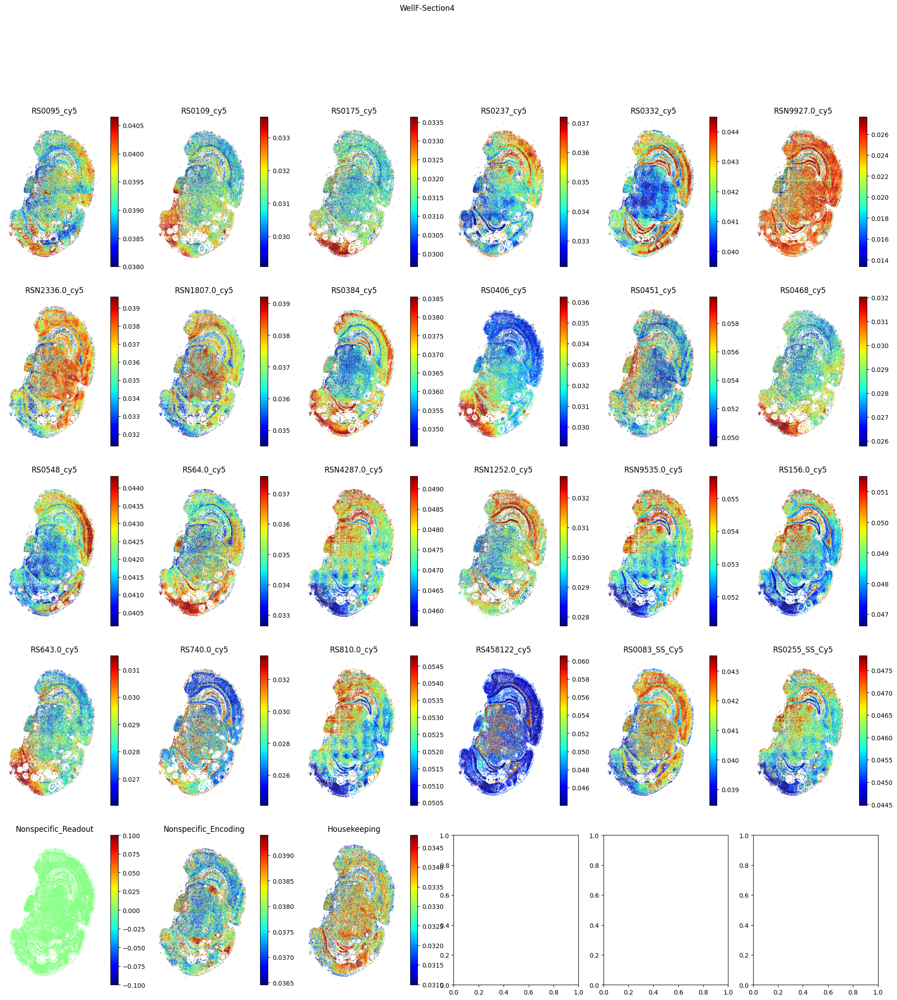

In [140]:
data = anndata.read_h5ad('/orangedata/Images2024/Zach/MouseBrainAtlas/WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08/Processing_2024Apr19/WellA-Section1/anndata/anndata.h5ad')
data

# Drop the 'IEG' variable from the data
data = data[:, np.array(data.var.index)!='IEG']


""" Nuclei Score """
""" detects cells whose brightness changes too much """
""" Likely due to gel or registration issues """
X = data.layers['nuc_raw'].copy()
X = np.clip(X,1,None) # Prevent divide by 0
X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['raw'].sum(1).ravel()
X = np.clip(X,1,None)
X = np.log10(X)
X = (X-np.median(X))/np.std(X)
sum_score = norm.pdf(X)/norm.pdf(0)
mask = sum_score>0.01


X = data.layers['raw'].copy()
X = np.clip(X,1,None)
X = np.log10(X)
X = X/np.sum(X,axis=1,keepdims=True)


fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle(f"Well{well}-Section{section}")
axs = axs.ravel()

for i in range(n_bits):
    c = X[:,i].copy()
    nuc_mask = data.layers['nuc_score'][:,i]>0.5
    vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,95])
    m = mask&nuc_mask
    scatter = axs[i].scatter(x[m],y[m],c=np.clip(c[m],vmin,vmax),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()

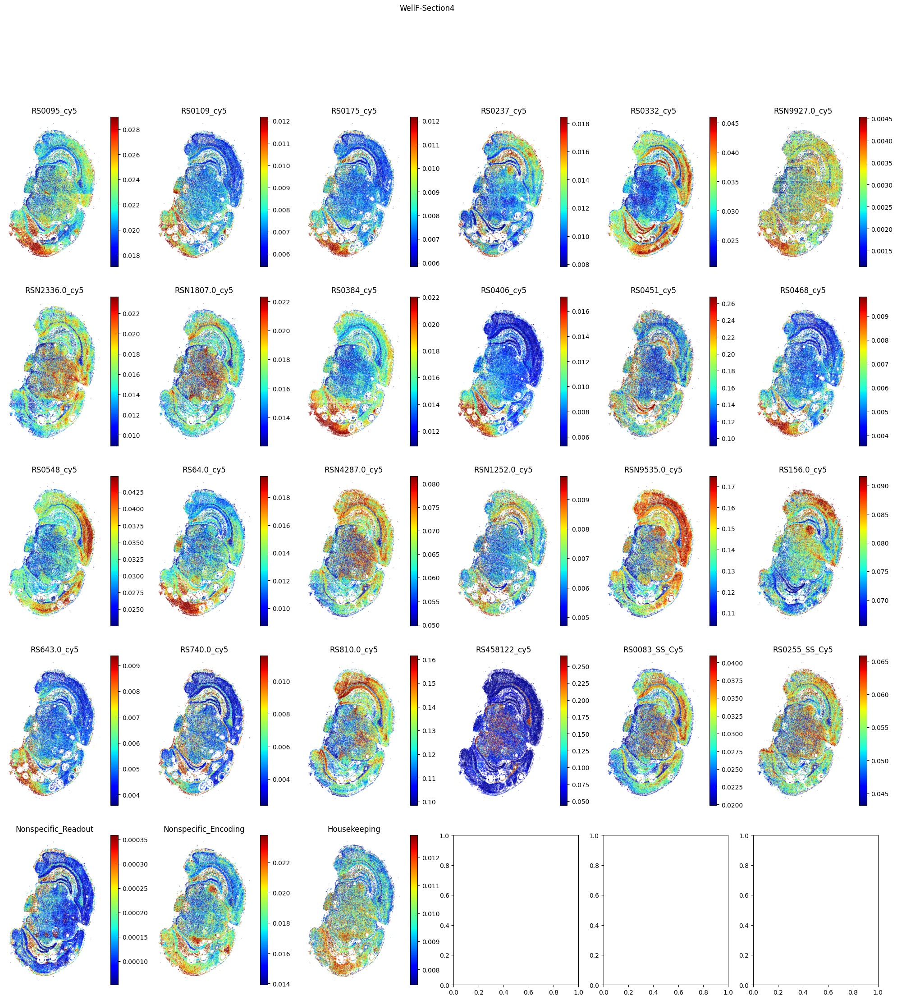

In [141]:
""" Nuclei Score """
""" detects cells whose brightness changes too much """
""" Likely due to gel or registration issues """
X = data.layers['nuc_raw'].copy()
X = np.clip(X,1,None) # Prevent divide by 0
X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['raw'].sum(1).ravel()
X = np.clip(X,1,None)
X = np.log10(X)
X = (X-np.median(X))/np.std(X)
sum_score = norm.pdf(X)/norm.pdf(0)
mask = sum_score>0.01


X = data.layers['raw'].copy()
X = np.clip(X,1,None)
# X = np.log10(X)
X = X/np.sum(X,axis=1,keepdims=True)


fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle(f"Well{well}-Section{section}")
axs = axs.ravel()

for i in range(n_bits):
    c = X[:,i].copy()
    nuc_mask = data.layers['nuc_score'][:,i]>0.5
    vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,95])
    m = mask&nuc_mask
    scatter = axs[i].scatter(x[m],y[m],c=np.clip(c[m],vmin,vmax),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()

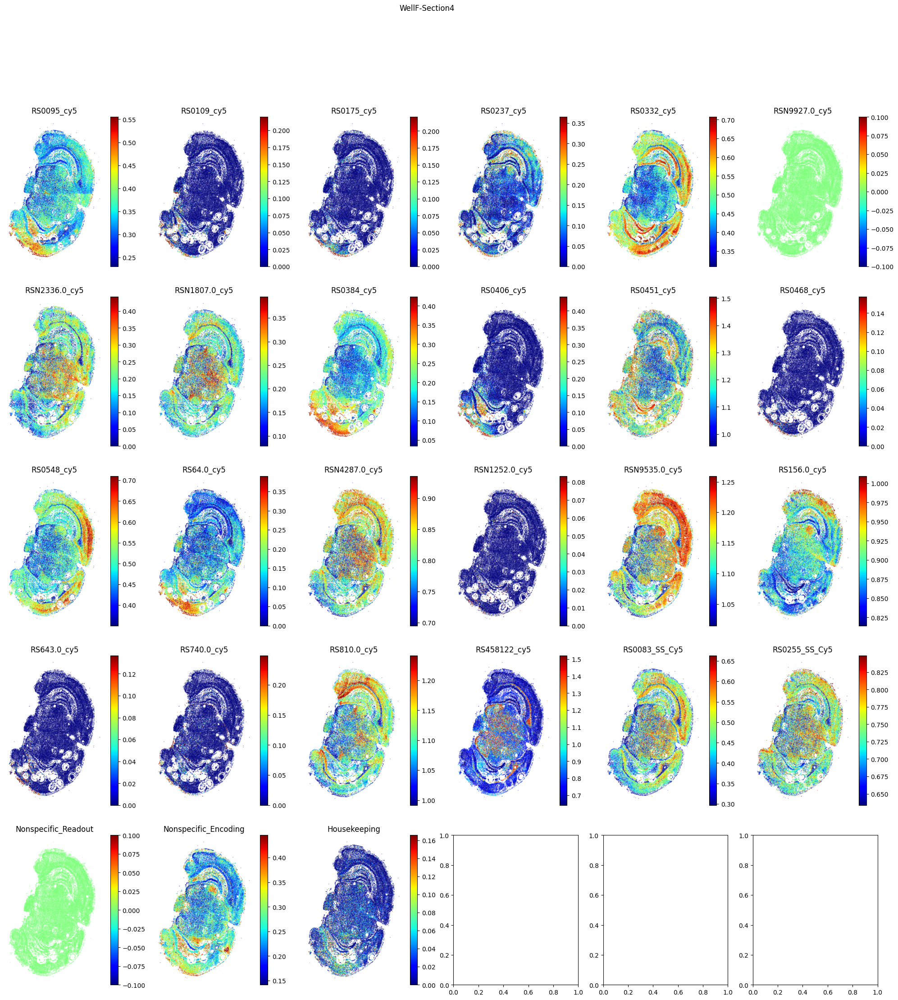

In [145]:
""" Nuclei Score """
""" detects cells whose brightness changes too much """
""" Likely due to gel or registration issues """
X = data.layers['nuc_raw'].copy()
X = np.clip(X,1,None) # Prevent divide by 0
X = X/np.median(X,axis=0,keepdims=True) # Correct for round to round staining
X = X/np.median(X,axis=1,keepdims=True) # correct for cell staining 
X = (X - np.median(X,axis=1,keepdims=True)) / np.mean(X.std(axis=1, keepdims=True)) # set median to 0 and std to 1 across rounds use average of std across all cells
X = norm.pdf(X)/norm.pdf(0) # Convert to probability density (norm max to 1 by prob at median)
data.layers['nuc_score'] = X.copy() # Values above 0.5 are within normal range 


n_bits = data.shape[1]
n_figs = n_bits
n_columns = 5
n_rows = math.ceil(n_figs/n_columns)
for i in range(n_figs):
    axs[i].axis('off')
    axs[i].set_aspect('equal')
x = data.obs['stage_x']
y = data.obs['stage_y']
# X = self.data.layers['processed_vectors'].copy()

X = data.layers['raw'].sum(1).ravel()
X = np.clip(X,1,None)
X = np.log10(X)
X = (X-np.median(X))/np.std(X)
sum_score = norm.pdf(X)/norm.pdf(0)
mask = sum_score>0.01


X = data.layers['raw'].copy()
X = np.clip(X,1,None)
# X = np.log10(X)
X = np.mean(np.sum(X,axis=1,keepdims=True))*X/np.sum(X,axis=1,keepdims=True)
X = np.log10(X)

fig,axs = plt.subplots(n_columns,n_rows,figsize=[25,25])
plt.suptitle(f"Well{well}-Section{section}")
axs = axs.ravel()

for i in range(n_bits):
    c = X[:,i].copy()
    nuc_mask = data.layers['nuc_score'][:,i]>0.5
    vmin,vmax = np.percentile(c[(np.isnan(c)==False)&mask&nuc_mask],[5,99])
    m = mask&nuc_mask
    # vmin = np.min([vmax-0.5,vmin])
    scatter = axs[i].scatter(x[m],y[m],c=np.clip(np.clip(c[m],vmin,vmax)-2,0,None),s=0.01,cmap='jet',marker='x')
    fig.colorbar(scatter, ax=axs[i])
    axs[i].set_title(np.array(data.var.index)[i])
    axs[i].axis('off')
plt.show()

In [138]:
data.obs.head()

,label,stage_x,stage_y,image_x,image_y,image_idx,size,section_index,dapi,sum,dataset,well,louvain,louvain_colors
WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08_SectionWellA-Section1_Cell1.0,1.0,1853.0,3609.0,376.0,833.0,35.0,161.0,WellA-Section1,1752.921631,7008.173828,WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024...,WellA,21,xkcd:light olive
WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08_SectionWellA-Section1_Cell2.0,2.0,1856.0,4097.0,864.0,836.0,35.0,133.0,WellA-Section1,1567.748047,4484.313477,WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024...,WellA,21,xkcd:light olive
WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08_SectionWellA-Section1_Cell3.0,3.0,1875.0,4281.0,1048.0,855.0,35.0,189.0,WellA-Section1,1213.001465,4325.013672,WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024...,WellA,21,xkcd:light olive
WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08_SectionWellA-Section1_Cell4.0,4.0,1877.0,3528.0,295.0,857.0,35.0,180.0,WellA-Section1,1969.594971,7669.754883,WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024...,WellA,31,xkcd:tealish green
WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024Apr08_SectionWellA-Section1_Cell5.0,5.0,1886.0,3552.0,319.0,866.0,35.0,277.0,WellA-Section1,3549.822266,9226.231445,WTF01_1.2.A_2.2.B_3.2.C_4.2.D_5.2.E_6.2.F_2024...,WellA,21,xkcd:light olive
